# PubDigest Run Example

## Installation

### Setup Environment
git clone https://github.com/dansteiert/PubDigest.git
cd PubDigest
conda env create -f environment.yml

## Imports

In [1]:
import os
import yaml
from IPython.display import Image

from misc.get_base_data import get_base_data
from main import main



### Get Data


In [2]:
get_base_data()

#### If the previous line produced an error:
This is done by script - in case it fails, here the instruction via the respective webseites:
USAN Stems for Drug Term Definition
From https://www.ama-assn.org/about/united-states-adopted-names/united-states-adopted-names-approved-stems
Download "list of USAN stems"
  - Hyperlink at 18.06.2024: https://www.ama-assn.org/system/files/stem-list-cumulative.xlsx )
  - Save it to ./base_data/USAN_Stems.xlsx
  - call: from misc.prep_USAN_stem import prep_usan
  - prep_usan()


Country, City, and Locations file (csv) from: https://simplemaps.com/data/world-cities
 - Basic Database
 - Hyperlink at 18.06.2024: https://simplemaps.com/static/data/world-cities/basic/simplemaps_worldcities_basicv1.77.zip
 - Unzip file and move the csv to ./base_data/worldcities.csv

## Setup Config

### Mandatory Config
These must be set to desired output!
the following config sections allow you to tweak the program to your desires

In [3]:
system_config_processors = 3 # on a PC should be at least MaxCPU - 1, else it will take space from the OS


# email should be the e-mail address of the maintainer of the tool, and should be a valid e-mail address
pmc_config_email = "YourEmail@MailServer.XYZ"

query_config_query_phrase = "Chronic thromboembolic pulmonary hypertension" # used for PubMed Query
query_config_query_phrase_abb = "CTEPH" # used for PubMed Query


# empty list to omit this task or a list of alternate_query_terms/ Associated Diseases
query_config_associated_diseases = ["venous thrombosis",
                                    # None,
]
# Match Order in associated_disease list
query_config_associated_diseases_abb = ["VT",
                                        # None,
                                        ]


config_name_suffix = f"{query_config_query_phrase_abb}_VT"

### Secondary Config

#### Query Config

In [4]:
query_config = {
    "base_query_term": query_config_query_phrase,

    "base_query_abb": query_config_query_phrase_abb, # Is used as additional term in the query
    "base_query_parameters": # Parameters to be passed on to PubMed
        {"Language": "english"},

    "alternate_query_terms": query_config_associated_diseases,
    # empty list to omit this task or a list of alternate_query_terms/ Associated Diseases



    "alternate_query_abb":  query_config_associated_diseases_abb,
    # This needs to match the order of the alternate query terms!
    # add - None to match terms for which you do not want to give a abbreviation

    "alternate_query_parameters": {"Language": "english"},

    # Timeinterval definition: # Important for Publications_by_Year_Intervals.png
    # "Fixed" Timeintervals 1, 2, 2, 4, 4, 8, 8, 16, 16, ...
    "starting_counter": 0,
    "starting_interval_size": 4,

    # Predefined publication list
    # This can be used to supply a file ofpubmed ids to be used instead of the query_phrase
    "query_ids_given": False,
    "query_ids_file_path": None,
    "query_ids_file_sep": ",",
    "query_ids_file_id_col": "PMID",

    "max_days_since_last_crawl": 30,  # update your database if the last update is in x days in the past

    # Term Prediction:
    "similar_terms_to_query": 40,  # How many terms to predict
    "prediction_year": 2024,  # From which year on to predict (retrospectively)
    "prediction_term": "CTEPH",  # The Term around which you want to predict (within the Embedding) - should appear in the text as a single word (no spaces or other delimiters).
    "terms_to_keep_in_embedding": [],  # Terms which might be filtered out due to special terms, but should still be included.

    # Disease Name Identifcation
    "minimum_naming": 5,  # remove all disease erms which have lower counts than this
    "top_x_1_gram_disease_names": "all",  # Plot the top disease terms # top X or "all"


    # Entere here to query for specific terms such as done for the publication Fig 4
    "terms_for_embedding_evaluation": [
        # Direct Term associations
        ['abiraterone', 'acenocumarol', 'acetazolamide', 'adiponectin',  'ambrisentan', 
         'anti-cardiolipin', 'anticardiolipin',  'armamentarium', 'arteriais', 
         'arteriosus', 'atorvastatin', 'aviptadil', 'azithromycin', 'baricitinib', 'beraprost', 'bosentan', 'calcilytic', 
         'calciparin', 'cardiolipin', 'cardiothoracic',  'ceftriaxone', 'chemoattractant', 'chylopericardium', 
         'cisplatin', 'clarithromycin', 'cyproterone', 'darbepoetin',  'digoxin', 'diltiazem',  'doxycycline', 
         'e-selectin', 'eculizumab',  'endostatin', 'epoetin', 'everolimus',  'fasudil', 'furosemide', 
          'hemopericardium',  'hepcidin', 'iloprost', 'imatinib', 'interstitium', 
         'intrathoracic', 'iodinate', 'iomeprol', 'ionise', 'ketanserin', 'ketoconazole', 'l-selectin', 'macitentan', 'meconium', 
         'melagatran',  'methylprednisolone', 'metoprolol', 'mucosal',  'nadroparin', 
         'neuroendocrine', 'nifedipine',   'omeprazole', 'p-selectin', 
         'paliperidone', 'paracrine', 'podoplanin',  'prednisolone', 'prohepcidin', "sildenafil",
         'pyridostigmine', 'rapamycin', 'regurgitant', 'riociguat', 'risperidone', 'rituximab', 'ruxolitinib',  
         'sofosbuvir',   'tadalafil', 'thromboxane', 'tofacitinib', 
          'troponin', 'valsartan', 'vardenafil', 
         'vasopressin',  'ximelagatran'],



        # Pro-Thrombotic
        [
            # from previously compiled list
            "caplacizumab", "benzarone", "enalaprilat", "trental", "mechlorethamine",
            "androgel",

            # https://www.drugs.com/drug-class/thrombolytics.html#
            "streptodornase", "vorapaxar", "abciximab", "eptifibatide", "tirofiban",
            "streptokinase",
            "alteplase", "tenecteplase", "reteplase", "urokinase", "streptase", "kinlytic",
            #"abbokinase",

            # https://www.drugs.com/drug-class/thrombin-inhibitors.html
            "dabigatran", "bivalirudin", "desirudin",

            # https://www.drugs.com/drug-class/heparins.html
            "enoxaparin", "delteparin", "tinzaparin", " danaparoid",

            # https://www.drugs.com/drug-class/factor-xa-inhibitors.html
            "apixaban", "fondaparinux", "rivaroxaban", "edoxaban", "betrixaban",

            # https://www.drugs.com/drug-class/coumarins-and-indandiones.html
            "warfarin",

            # https://www.drugs.com/drug-class/antiplatelet-agents.html
            "aspirin", "cangrelor", "cilostazol", "clopidogrel", "dipyridamole", "prasugrel",
            "ticlopidine", "ticagrelo"],

        # Anti Thrombose
        [
            # from a compiled list
            "carfilzomib", "etanercept", "olmesartan", "olanzapine", "ponatinib", "levaminsol",

            # https://link.springer.com/article/10.1007/s40264-013-0054-6/tables/1
            "ciclosporin", "5-FU", "bleomycin", "busulfan", "cis-platinum", "doxorubicin",
            "gemtuzumab", "asparainase", "l-asparainase", "mitomycin", "paclitaxel",
            "tamoxifen",
            "thalidomide", "bevacizumab", "rofecoxib", "ephedra", "erythropoietin", "heparin",
            "ciclosporin", "glucocoricoids", "dexamethasone", "sirolimus", "interferon",
            "interferon-alpha",
            "metformin", "quinine", "escitalopram", "sildenafil", "ticlopidin", "clopidogrel",
            "tranexamic"
        ]]
}
with open(os.path.join(os.getcwd(), "Configurations",  "Query", f"config_{config_name_suffix}.yml"), "w") as f:
    yaml.dump(query_config, f)

#### Natural Language Processing (NLP) Config

In [5]:
nlp_config = {


    "n_gram_list": [1], # [1, 3, 5],

    # Frequent words which usually hold no proper meaning - extend if additional words are of no interest (should just be used for filling terms)
    "words_to_remove": ["have", "be", "use", "may", "not", "II", "III", "IV", "VI", "VII", "VIII"],

    # Currently only avg implemented
    "tfidf_filter_criterion": "avg",

    # Filter Medical terms (Clinical Features) by specific suffixes (medicalterms_to_ignore_suffix) or full terms (medicalterms_to_ignore)
    "filter_medical_terms": True,
    "medicalterms_to_ignore_suffix": ["ase", "pathy", "thoracic", "graphy", "pathic"],
    "medicalterms_to_ignore": ["april"],

    # Filter disease terms by terms which do not reflect diseases
    "disease_terms_to_ignore": ["diagnosis", "prognosis", "misdiagnosis", "analysis", "basis",
                              "meta-analysis", "ontology", "doagra", "angiogram", "hypothesis", "program", "synthesis",
                              "poor-prognosis"],


    # Embedding options:
    # Method
    # "skip_gram_CBOW": "CBOW",  # CBOW or skip-gram
    "skip_gram_CBOW": "skip-gram",  # CBOW or skip-gram
    #  From which year on out, models should be build
    "min_year": 2022,
        # Interval at which years are build starting at current year, e.g. 3 builds intervals like 2021, 2018, 2015, ...
        # This might be interesting for a validation set in the past e.g. which drugs could be predicted in 2018 but are now available for this indication
    "year_interval": 1,

    # Currently not used
    # "update_w2v_model": False,

    # Dictionary of terms to be passed to the function gensim.models.word2vec.Word2Vec (https://radimrehurek.com/gensim/models/word2vec.html#gensim.models.word2vec.Word2Vec)
    # already set are: sentences, workers (via System config - processors), sg (via skip_gram_CBOW)
    "word2vec": {"min_count": 5},
    "prediction_term_category": "_med", # options include _med, _abb, _abb_med, _disease
# Text Summary: to write out a text summary file (./data/QUERY_TERM/Text Summary/summary{_}.txt)
"summary_top_x_terms": 20, # Get the top X terms in a research area
"summary_top_x_authors": 20, # Get the top X published authors
"summary_top_x_publications": 20 # Get the top X cited publications
}

with open(os.path.join(os.getcwd(), "Configurations",  "NLP", f"config_{config_name_suffix}.yml"), "w") as f:
    yaml.dump(nlp_config, f)

#### PubMedCentral (PMC) config

In [6]:
pmc_config = {
    "tool_name": "PubDigest", # PubMed Central kindly requests, to identify services
"email": pmc_config_email, # email should be the e-mail address of the maintainer of the tool, and should be a valid e-mail address

# Options to pass to pymed function -> https://github.com/dansteiert/pymed fork from https://github.com/gijswobben/pymed
"pymed": {
  "max_results": 100000000,
  "batch_size": 250,
  "timeout": 100,
},

# Options to query iCite website https://icite.od.nih.gov/
"iCite": {
  "fields_to_return": None,
  "chunck_size": 250, #  do not increase too high -> results in issues with iCite API!
},

# How Many months should pass before the citations are updated
"iCite_update_in_months": 6}
with open(os.path.join(os.getcwd(), "Configurations",  "PMC", f"config_{config_name_suffix}.yml"), "w") as f:
    yaml.dump(pmc_config, f)

#### System Settings

In [7]:
system_config = {  # System setup
    "working_dir": None,  # if None, the current working directory is used

    "processors": system_config_processors,  #  leave a processor free for OS if running on a PC!
    "dataset_compile_batch_size": 10000,


    "logging": {
        "logger_name": "PubDigest",
        "format": '[%(levelname)s] [%(asctime)s] (%(filename)s:%(lineno)d) - %(message)s',
        "filename": os.path.join(os.getcwd(), "data", query_config_query_phrase, f"log_file_{config_name_suffix}.log"),
        "level": "INFO"},

    # Log to the consol as well as to a file, specified above
    "logging_console": True
}
with open(os.path.join(os.getcwd(), "Configurations",  "System", f"config_{config_name_suffix}.yml"), "w") as f:
    yaml.dump(system_config, f)

#### Visualization Config

In [8]:
visualization_config = {
    # Plotting options
    "categorial_colorfull_colors": ["#4daf4a", "#e41a1c", "#377eb8", "#984ea3", "#ff7f00", "#a65628", "#ffff33",
                                  "#f781bf", "#999999"],
    "categorial_colors_monochrom": ["#FFFFFF", "#808080", "#000000"],
    # diverging_colors: "Spectral"
    "diverging_colors": "coolwarm",
    "single_color": "#0d0c8f",  # - blue
    # "single_color": "#00b300", #- green
    # "single_color": "#808080", #- grey
    "single_color_prominent": "#000000",  # - black
    "alternating_background_colors": ["#000000", "#808000"],
    "heatmap_start_year": 2000,
    "heatmap_start_year_disease": 1970,
    "save_as_svg": True,


    "with_title": False}
with open(os.path.join(os.getcwd(), "Configurations",  "Visualisations", f"config_{config_name_suffix}.yml"), "w") as f:
    yaml.dump(visualization_config, f)

#### Workflow Config

In [9]:
workflow_config = {  # Define program steps:
    # Data Processing
    "update_dataset": False,  # re-crawl PubMed
    "sanitise_missing_publications": False,  # process data/get into processable format
    "affiliation_search": True,  # Map affiliations to our dataset
    "update_citations": False,  # query iCite for new data
    "skip_build_dataset": True,  # only applicable if a dataset already exists
    "additional_publications_dataset_rebuild_threshold": 1000,
    "process_by_timeinterval": True,

    # Extra Tasks
    "gen_abb_dict": True,  # Generate dictionary of abbreviations
    "gen_text_summary": True,  # Generate short summaries

    # Plotting
    "gen_plots": True,  # Plot all available data
    "keyword_plotting": True,  # Plot key words by timeinterval

    # Embedding
    "train_w2v_model": True,
    "train_joined_embeddings": True,
    "predict_transferable_terms": True
}
with open(os.path.join(os.getcwd(), "Configurations",  "Workflow", f"config_{config_name_suffix}.yml"), "w") as f:
    yaml.dump(workflow_config, f)

#### Debug Config & Locations Config & Supporting Information
Debug Config: printing option for missed affiliations
Locations Config: Some name conversions (can be extended if necessary)


If these other versions of these configs these need to be adapted in the main_config


#### Main Config

In [10]:
main_config = {"System": f"Configurations/System/config_{config_name_suffix}.yml",

"Workflow": f"Configurations/Workflow/config_{config_name_suffix}.yml",
"Query": f"Configurations/Query/config_{config_name_suffix}.yml",

"Supporting_info": f"Configurations/Supporting Information/config.yml",

"PMC": f"Configurations/PMC/config_{config_name_suffix}.yml",

"Locations": f"Configurations/Locations/config.yml",
"NLP": f"Configurations/NLP/config_{config_name_suffix}.yml",

"Visualisations": f"Configurations/Visualisations/config_{config_name_suffix}.yml",


"Debug": f"Configurations/Debug/config.yml"}

with open(os.path.join(os.getcwd(), "Configurations",  "Config_Main", f"config_{config_name_suffix}.yml"), "w") as f:
    yaml.dump(main_config, f)

## Run Example

In [11]:
main(os.path.join(os.getcwd(), "Configurations",  "Config_Main", f"config_{config_name_suffix}.yml"))

[INFO] [2024-07-30 16:39:16,177] (main.py:39) - Workflow: Download Data & Generate Dataset
[INFO] [2024-07-30 16:39:16,191] (update_database.py:23) - Data Collection - started for: chronic thromboembolic pulmonary hypertension
[INFO] [2024-07-30 16:39:16,205] (update_database.py:53) - Data Collection - Read publication IDs from disk
[INFO] [2024-07-30 16:39:16,296] (update_database.py:59) - Data Collection - Publication IDs wrote to disk
[INFO] [2024-07-30 16:39:16,302] (update_database.py:84) - Data Collection - No files to download
[INFO] [2024-07-30 16:39:19,143] (update_database.py:169) - Data Collection - Dataset read from disk. Datasets contains 3614 entries.
[INFO] [2024-07-30 16:39:19,152] (main.py:42) - Workflow: Generate Author Table
[INFO] [2024-07-30 16:39:19,164] (authors.py:15) - Author Table generation and Dataset Table update -  Start
[INFO] [2024-07-30 16:39:20,772] (authors.py:18) - Author Table -  Read from Disk
[INFO] [2024-07-30 16:39:20,772] (main.py:45) - Workflo

## Figure 2

In [12]:
Image(os.path.join(os.getcwd(), "data", query_config_query_phrase.lower(), "Plot", "Keywords", "1_gram", "_med", "1_gram_med_wordcloud_full.png"))

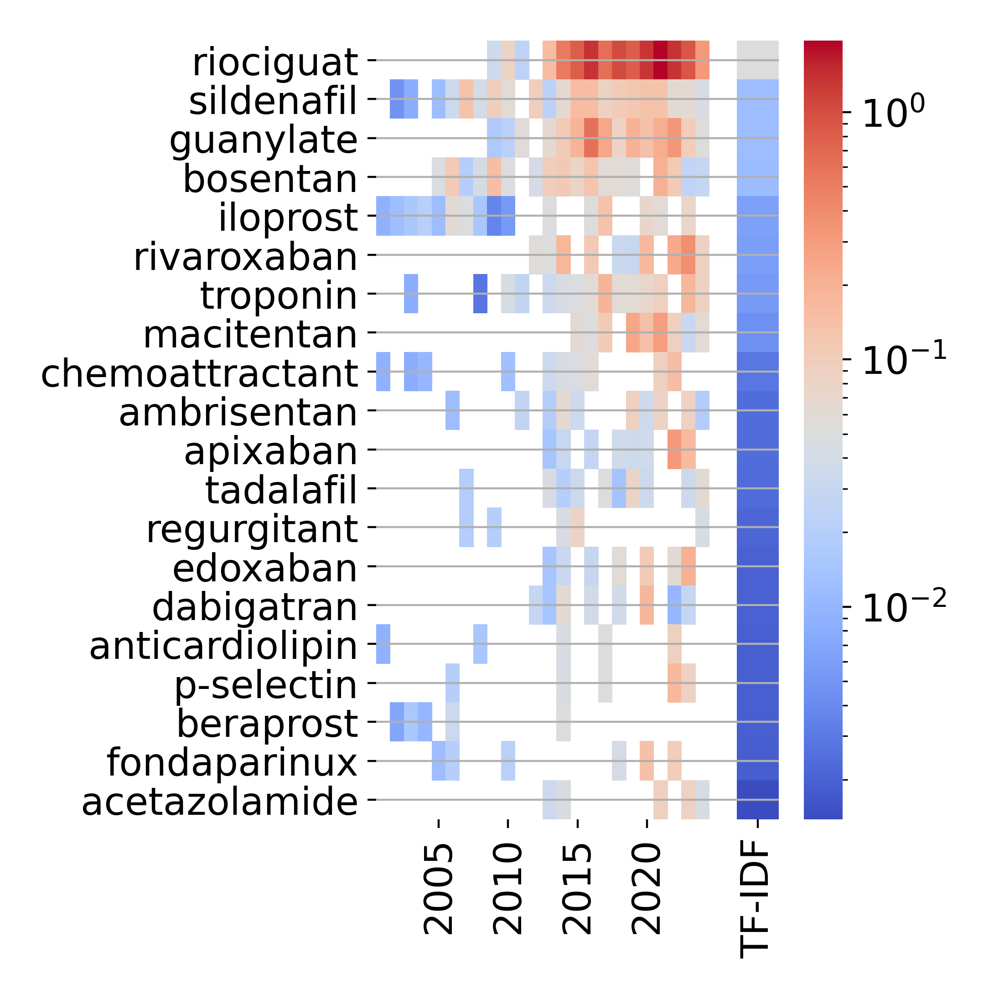

In [13]:
Image(os.path.join(os.getcwd(), "data", query_config_query_phrase.lower(), "Plot", "Keywords", "1_gram", "_med", "tfidf_1_gram_med_filtered_global_sort.png"))

## Figure 3

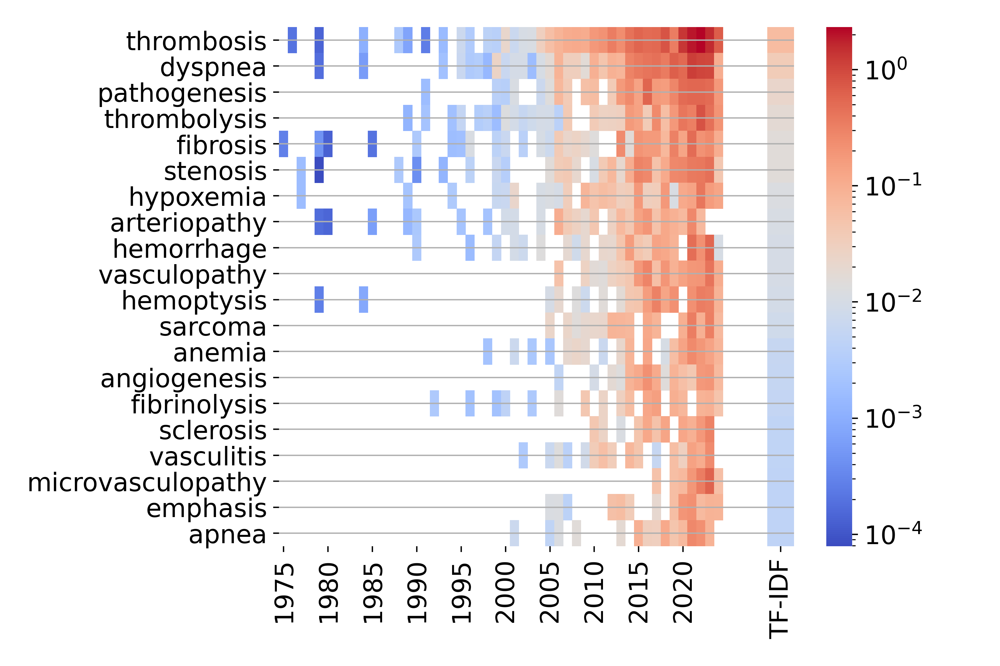

In [14]:
Image(os.path.join(os.getcwd(), "data", query_config_query_phrase.lower(), "Plot", "Keywords", "1_gram", "_disease", "tfidf_1_gram_disease_filtered_global_sort.png"))

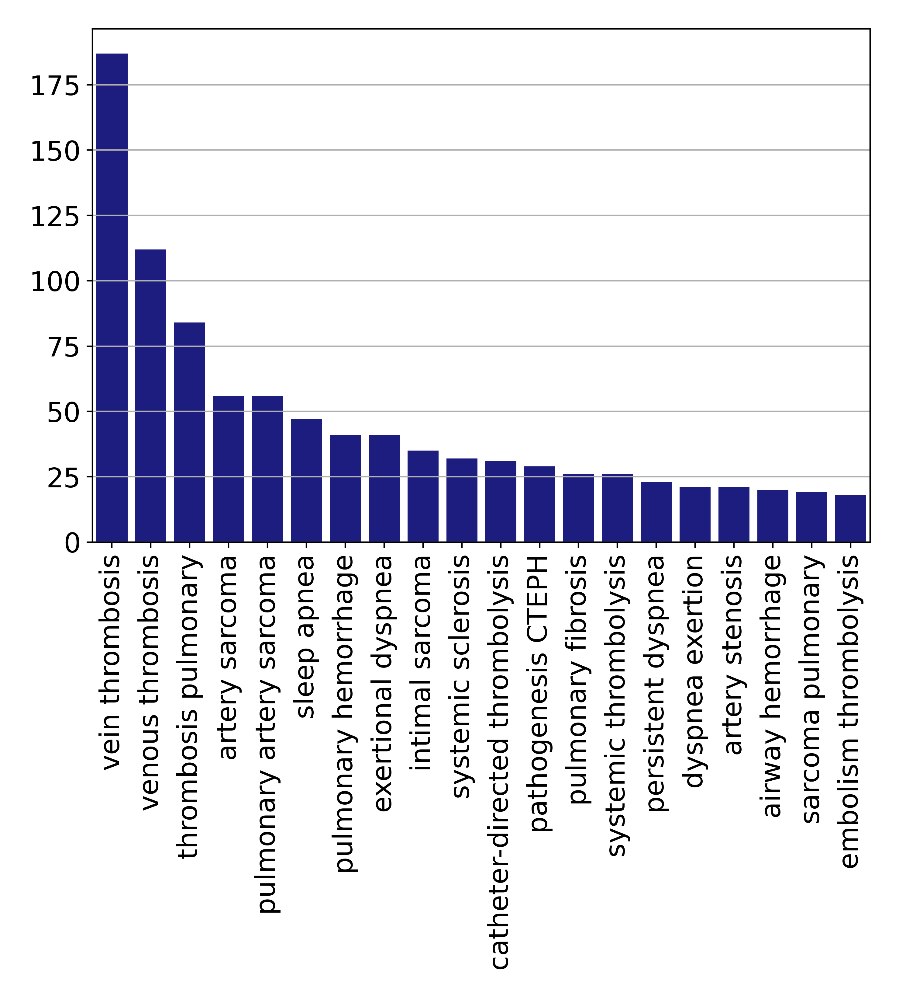

In [15]:
Image(os.path.join(os.getcwd(), "data", query_config_query_phrase.lower(), "Plot", "Disease_names_top_all.png"))

## Figure 4

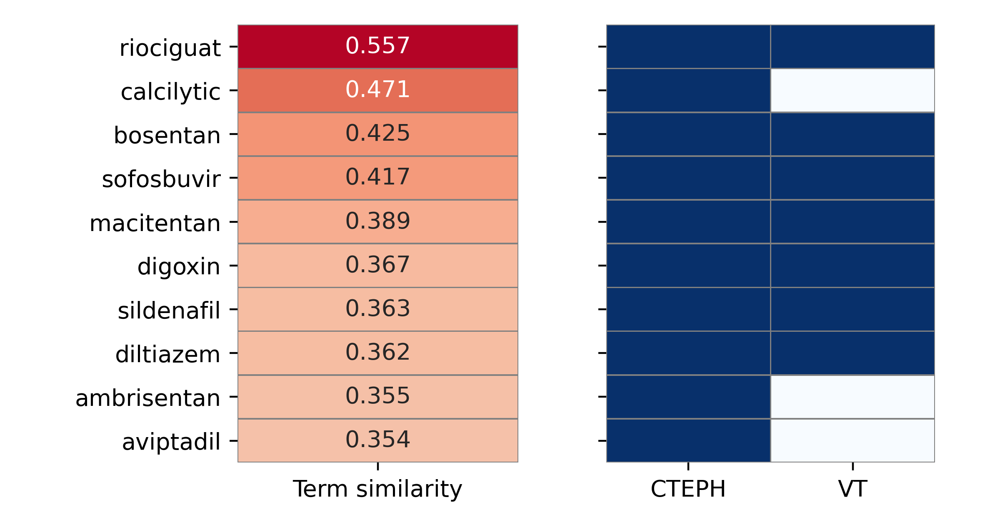

In [16]:
Image(os.path.join(os.getcwd(), "data", query_config_query_phrase.lower(), "Plot", "Embedding", f"specific_term_validation_{nlp_config['skip_gram_CBOW']}_{query_config_query_phrase_abb}_{query_config_associated_diseases[0].lower()}_group_0_publication.png"))

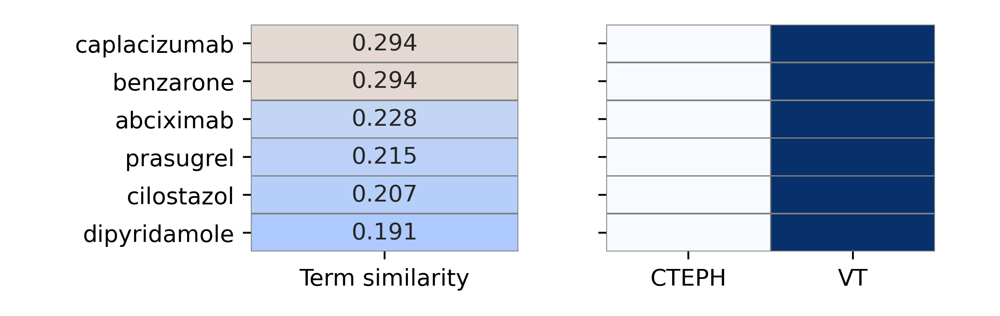

In [17]:
Image(os.path.join(os.getcwd(), "data", query_config_query_phrase.lower(), "Plot", "Embedding", f"specific_term_validation_{nlp_config['skip_gram_CBOW']}_{query_config_query_phrase_abb}_{query_config_associated_diseases[0].lower()}_group_1_publication.png"))

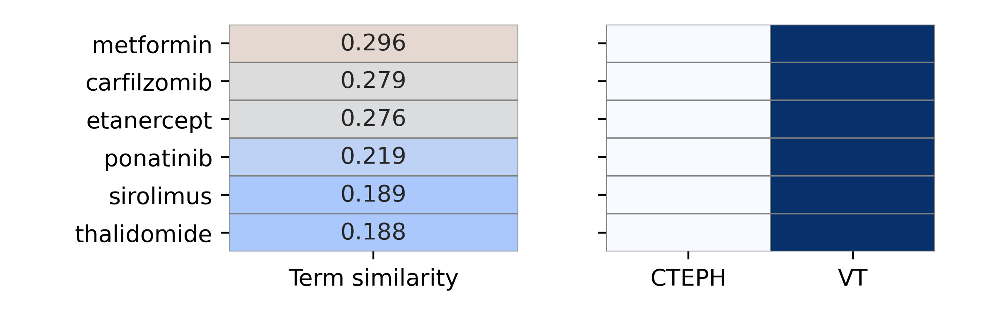

In [18]:
Image(os.path.join(os.getcwd(), "data", query_config_query_phrase.lower(), "Plot", "Embedding", f"specific_term_validation_{nlp_config['skip_gram_CBOW']}_{query_config_query_phrase_abb}_{query_config_associated_diseases[0].lower()}_group_2_publication.png"))